In [1]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
import colormaps as cmaps
from magpie_data import NeLMap2, FaradayMap2, PolarimetryMap2, InterferogramOntoAlpha

In [2]:
%cd "C:\Users\jdavies\Google Drive\MAGPIE\data\2016\s0701_16 Horizontal Double Exploder Faraday\s0701_16 Faraday"

C:\Users\jdavies\Google Drive\MAGPIE\data\2016\s0701_16 Horizontal Double Exploder Faraday\s0701_16 Faraday


In [3]:
R0fn="s0701_16_103044_c1.png"
R1fn="s0701_16_103051_c2.png"
B0fn="s0701_16_103044_c1.png"
B1fn="s0701_16_103051_c2.png"
S0fn="s0701_16_112804_c1.png"
S1fn="s0701_16_112811_c2.png"
s=PolarimetryMap2(R0fn, R1fn, B0fn, B1fn, S0fn, S1fn, rot_angle=-90)

In [4]:
s.register()
s.convert_to_alpha()

C:\Users\jdavies\Anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:549: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


<IPython.core.display.Javascript object>


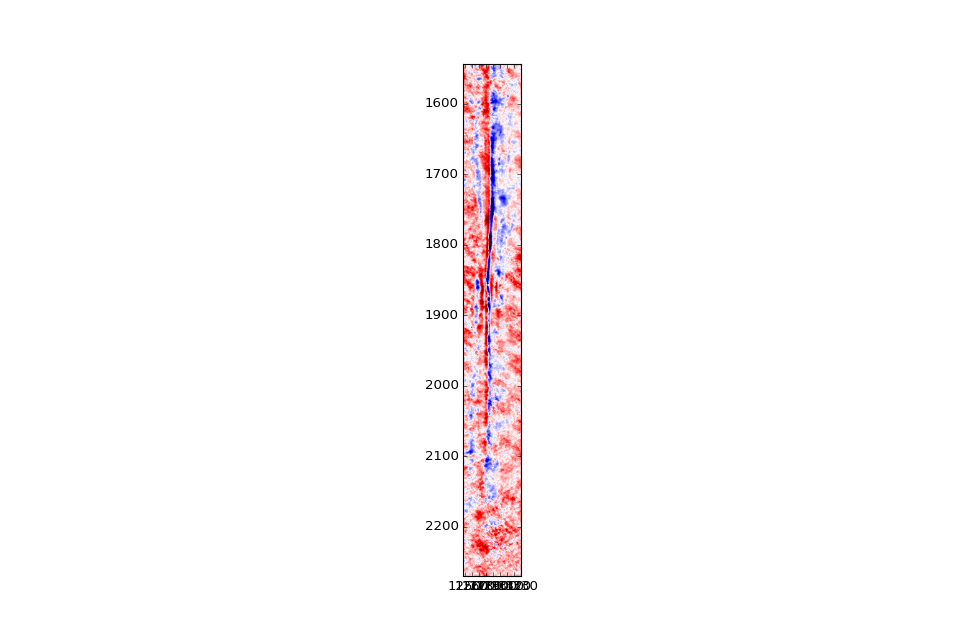

In [41]:
s.plot_data_px(clim=[-1,1])

In [5]:
s.scale=59
s.set_origin((1853,1287), extent=[-13,13,-11,11])

<IPython.core.display.Javascript object>


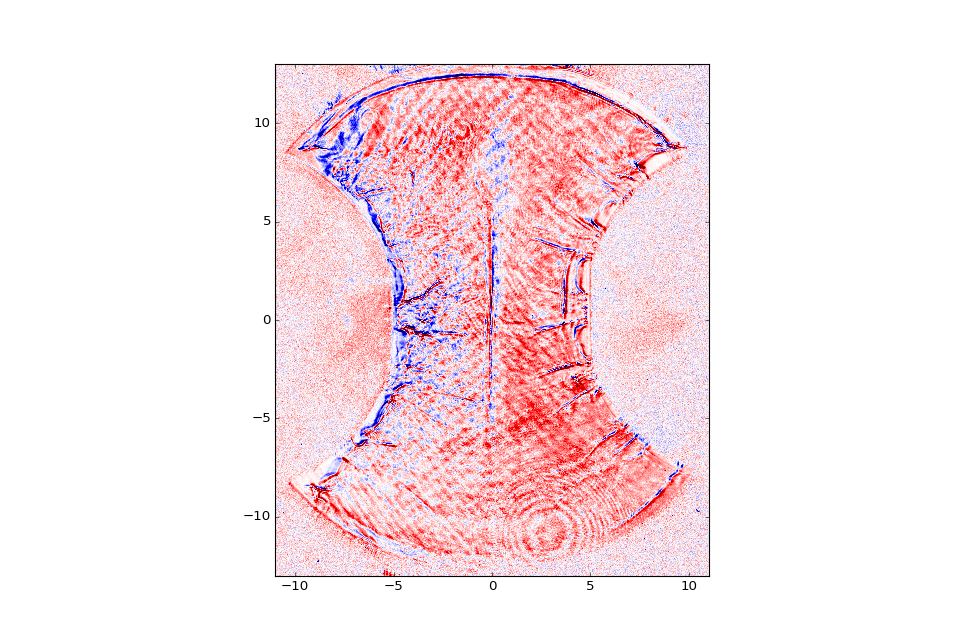

In [6]:
s.plot_data_mm(clim=[-1,1])

<IPython.core.display.Javascript object>


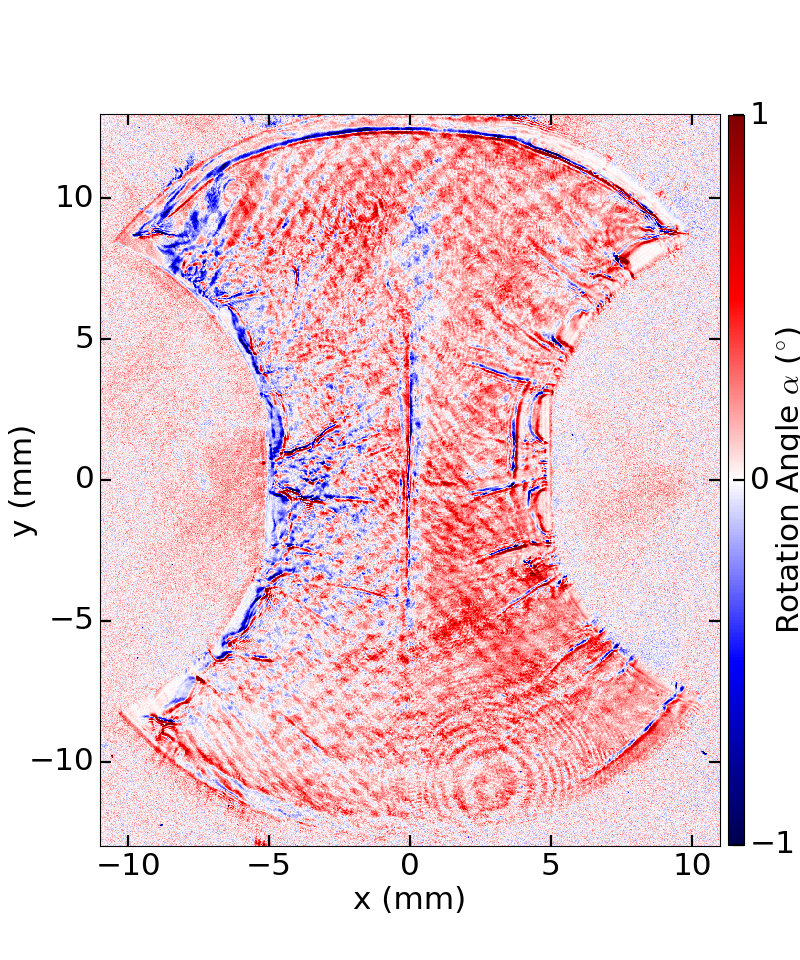

In [7]:
fig, ax=plt.subplots(figsize=(10,12))
far=s.plot_data_mm(ax=ax, clim=[-1,1])

ax.set_xlabel('x (mm)',fontsize=28)
ax.set_ylabel('y (mm)',fontsize=28)

ax.set_xticks([-10,-5,0,5,10])
ax.set_yticks([-10,-5,0,5,10])

ax.tick_params(labelsize=28, pad=5, length=10, width=2)
ax.get_yaxis().set_label_coords(-0.1,0.5)

cbar_ax = fig.add_axes([0.91, 0.12, 0.02, 0.76])#left,bottom,width,height
cbar_ax.tick_params(labelsize=28, pad=5, length=10, width=2)
fig.colorbar(far, cax=cbar_ax, ticks=[-1,0,1])
cbar_ax.set_ylabel(r'Rotation Angle $\alpha$ ($^{\circ}$)',fontsize=28)

cbar_ax.get_yaxis().set_label_coords(2.9,0.5)



In [72]:
fig.savefig('s0701_16 polarogram.png', dpi=600, bbox_inches='tight')

# Corrections to systematic error in alpha

## Start by correcting for non zero rotation angle outside of probing area

(767, 59) (767, 324)
(767, 1239) (767, 973)


<IPython.core.display.Javascript object>


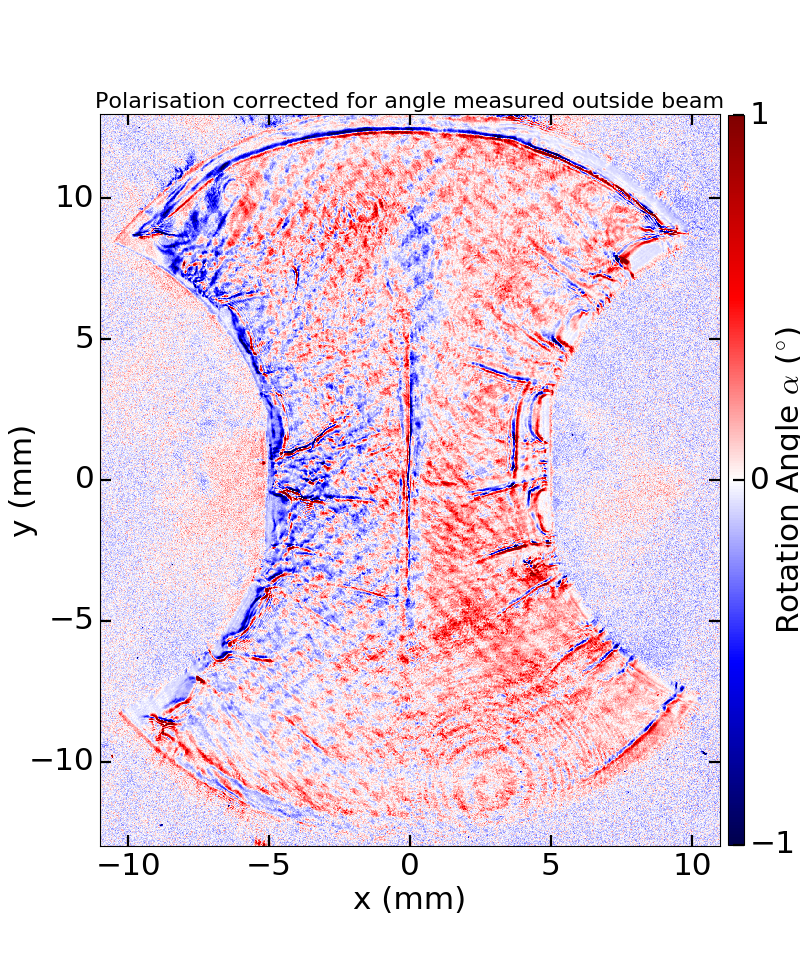

In [58]:
s.create_lineout(start=(0,-10), end=(0,-5.5), lineout_width=2*s.scale)
left_m=np.mean(s.lo)
s.create_lineout(start=(0,10), end=(0,5.5), lineout_width=2*s.scale)
right_m=np.mean(s.lo)
metal=(left_m+right_m)/2
alpha_metal=s.data_c-0.07

fig, ax=plt.subplots(figsize=(10,12))
far=ax.imshow(alpha_metal, cmap=s.cmap, interpolation='none', clim=[-1,1], extent=s.extent, aspect=1)

ax.set_xlabel('x (mm)',fontsize=28)
ax.set_ylabel('y (mm)',fontsize=28)

ax.set_xticks([-10,-5,0,5,10])
ax.set_yticks([-10,-5,0,5,10])

ax.tick_params(labelsize=28, pad=5, length=10, width=2)
ax.get_yaxis().set_label_coords(-0.1,0.5)

ax.set_title('Polarisation corrected for angle measured outside beam', fontsize=20)

cbar_ax = fig.add_axes([0.91, 0.12, 0.02, 0.76])#left,bottom,width,height
cbar_ax.tick_params(labelsize=28, pad=5, length=10, width=2)
fig.colorbar(far, cax=cbar_ax, ticks=[-1,0,1])
cbar_ax.set_ylabel(r'Rotation Angle $\alpha$ ($^{\circ}$)',fontsize=28)

cbar_ax.get_yaxis().set_label_coords(2.9,0.5)

In [59]:
fig.savefig('s0701_16 polarogram corrected for angle outside laser beam.png', dpi=600, bbox_inches='tight')

## Correct for non zero alpha in ablation flows

(1209, 501) (1209, 796)


<IPython.core.display.Javascript object>


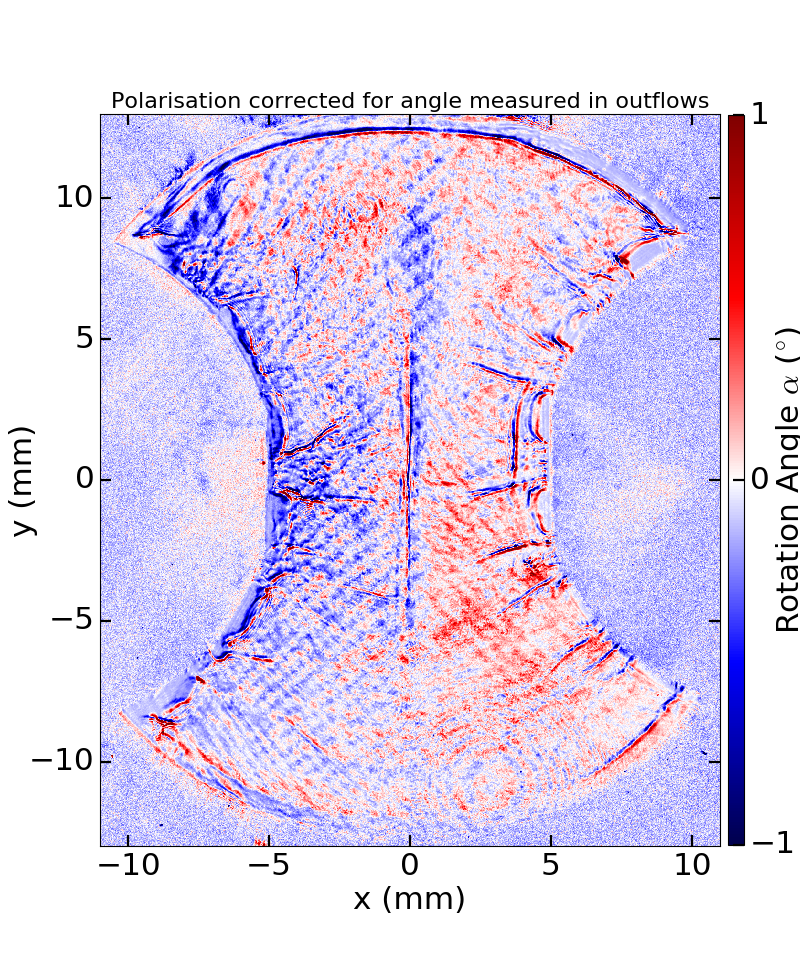

In [60]:
s.create_lineout(start=(-7.5,-2.5), end=(-7.5,2.5), lineout_width=1*s.scale)

outflows=np.mean(s.lo)
alpha_outflows=s.data_c-outflows

fig, ax=plt.subplots(figsize=(10,12))
far=ax.imshow(alpha_outflows, cmap=s.cmap, interpolation='none', clim=[-1,1], extent=s.extent, aspect=1)

ax.set_xlabel('x (mm)',fontsize=28)
ax.set_ylabel('y (mm)',fontsize=28)

ax.set_xticks([-10,-5,0,5,10])
ax.set_yticks([-10,-5,0,5,10])

ax.tick_params(labelsize=28, pad=5, length=10, width=2)
ax.get_yaxis().set_label_coords(-0.1,0.5)

ax.set_title('Polarisation corrected for angle measured in outflows', fontsize=20)


cbar_ax = fig.add_axes([0.91, 0.12, 0.02, 0.76])#left,bottom,width,height
cbar_ax.tick_params(labelsize=28, pad=5, length=10, width=2)
fig.colorbar(far, cax=cbar_ax, ticks=[-1,0,1])
cbar_ax.set_ylabel(r'Rotation Angle $\alpha$ ($^{\circ}$)',fontsize=28)

cbar_ax.get_yaxis().set_label_coords(2.9,0.5)


In [63]:
outflows

0.13665287

In [61]:
fig.savefig('s0701_16 polarogram corrected for angle in outflows.png', dpi=600, bbox_inches='tight')

<IPython.core.display.Javascript object>


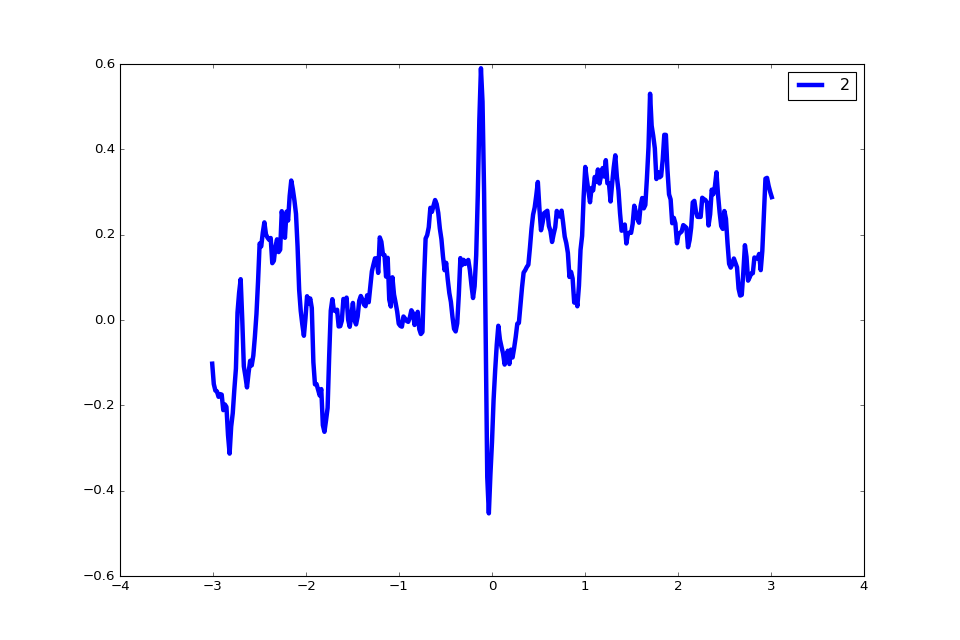

(885, 472) (885, 826)


In [116]:
fig, ax=plt.subplots(figsize=(12,8))

for yy in [2]:
    s.create_lineout(start=(yy,-3), end=(yy,3), lineout_width=0.1*s.scale)
    s.plot_lineout(ax=ax, label=str(yy))
ax.legend()

# Overlay Interferometry

In [ ]:
%cd "C:\Users\jdavies\Google Drive\MAGPIE\data\2016\s0701_16 Horizontal Double Exploder Faraday"

In [83]:
I0fn="s0701_16 IR end on interferometry (2).JPG"
I1fn="s0701_16 IR end on interferometry (1).JPG"
IO=InterferogramOntoAlpha(s, I0fn, I1fn)

C:\Users\jdavies\Anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:549: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


In [84]:
IO.register()

C:\Users\jdavies\Anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:549: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


In [92]:
IO.scale=59
IO.set_origin((1853,1287), extent=[-13,13,-11,11])

<IPython.core.display.Javascript object>


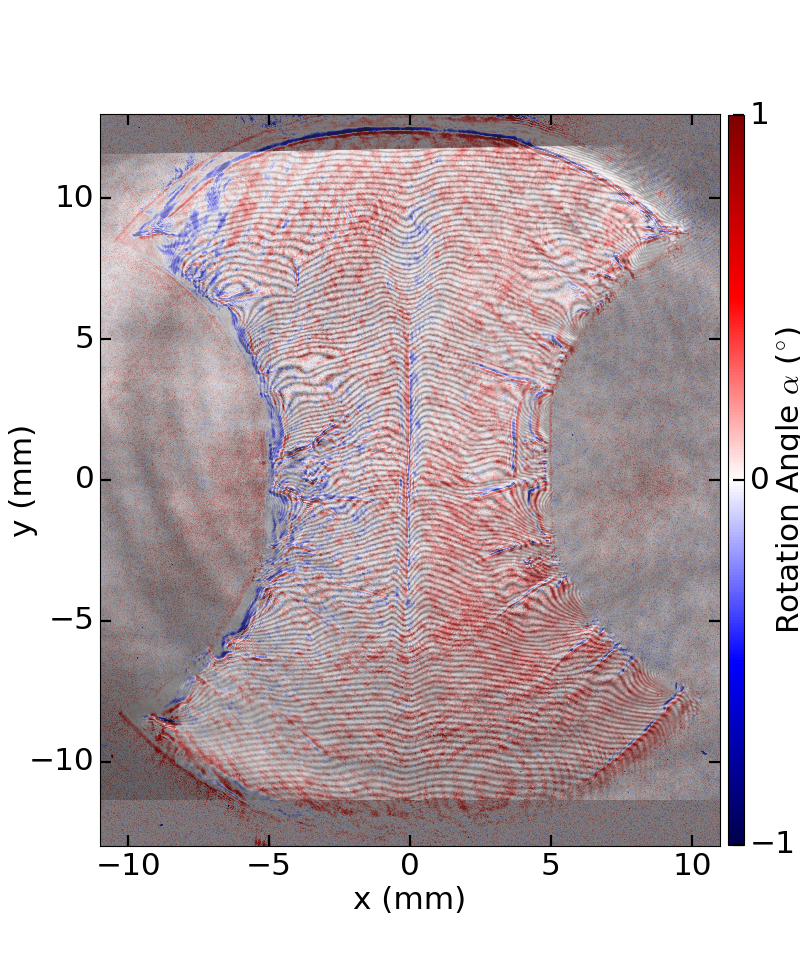

In [99]:
fig, ax=plt.subplots(figsize=(10,12))
far=s.plot_data_mm(ax=ax, clim=[-1,1])

ax.set_xlabel('x (mm)',fontsize=28)
ax.set_ylabel('y (mm)',fontsize=28)

ax.set_xticks([-10,-5,0,5,10])
ax.set_yticks([-10,-5,0,5,10])

ax.tick_params(labelsize=28, pad=5, length=10, width=2)
ax.get_yaxis().set_label_coords(-0.1,0.5)

ax.imshow(IO.data_c, cmap='gray', alpha=0.6, extent=s.extent)


cbar_ax = fig.add_axes([0.91, 0.12, 0.02, 0.76])#left,bottom,width,height
cbar_ax.tick_params(labelsize=28, pad=5, length=10, width=2)
fig.colorbar(far, cax=cbar_ax, ticks=[-1,0,1])
cbar_ax.set_ylabel(r'Rotation Angle $\alpha$ ($^{\circ}$)',fontsize=28)

cbar_ax.get_yaxis().set_label_coords(2.9,0.5)




In [101]:
fig.savefig('s0701_16 polarogram w interferometry.png', dpi=300, bbox_inches='tight')

<IPython.core.display.Javascript object>


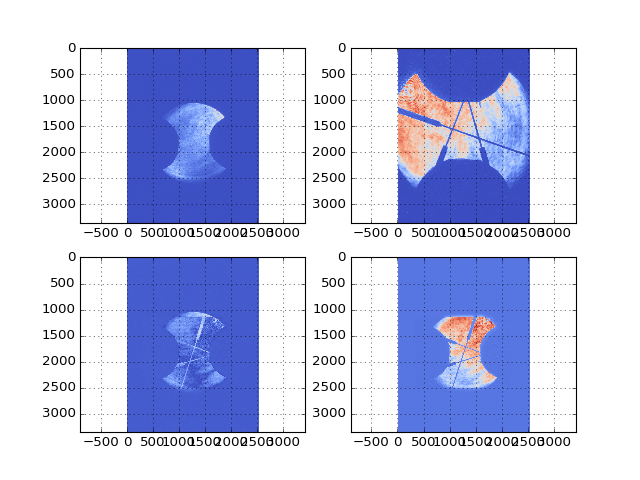

<IPython.core.display.Javascript object>


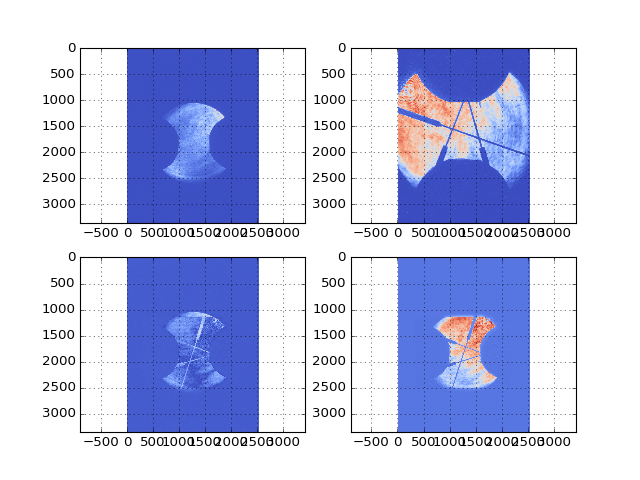

In [105]:
ird.imshow(s.R0,IO.I0zcn, IO.transform['timg'])

# Bring in The Density Map

In [18]:
%cd "C:\Users\jdavies\Google Drive\MAGPIE\data\2016\s0701_16 Horizontal Double Exploder Faraday"

C:\Users\jdavies\Google Drive\MAGPIE\data\2016\s0701_16 Horizontal Double Exploder Faraday


In [19]:
I0fn="s0701_16 IR end on interferometry (2).JPG"
nefn="s0701_16 IR neL.txt"
b=FaradayMap2(s, I0fn, nefn)

C:\Users\jdavies\Anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:549: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


In [20]:
b.register()

C:\Users\jdavies\Anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:549: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)
C:\Users\jdavies\Documents\magpie-analysis\magpie_data.py:171: RuntimeWarning: divide by zero encountered in true_divide
  self.data=5.99e18*self.pm.data/self.IT
C:\Users\jdavies\Documents\magpie-analysis\magpie_data.py:171: RuntimeWarning: overflow encountered in true_divide
  self.data=5.99e18*self.pm.data/self.IT
C:\Users\jdavies\Documents\magpie-analysis\magpie_data.py:171: RuntimeWarning: invalid value encountered in true_divide
  self.data=5.99e18*self.pm.data/self.IT


In [21]:
b.scale=59
b.set_origin((1853,1287), extent=[-13,13,-11,11])

<IPython.core.display.Javascript object>


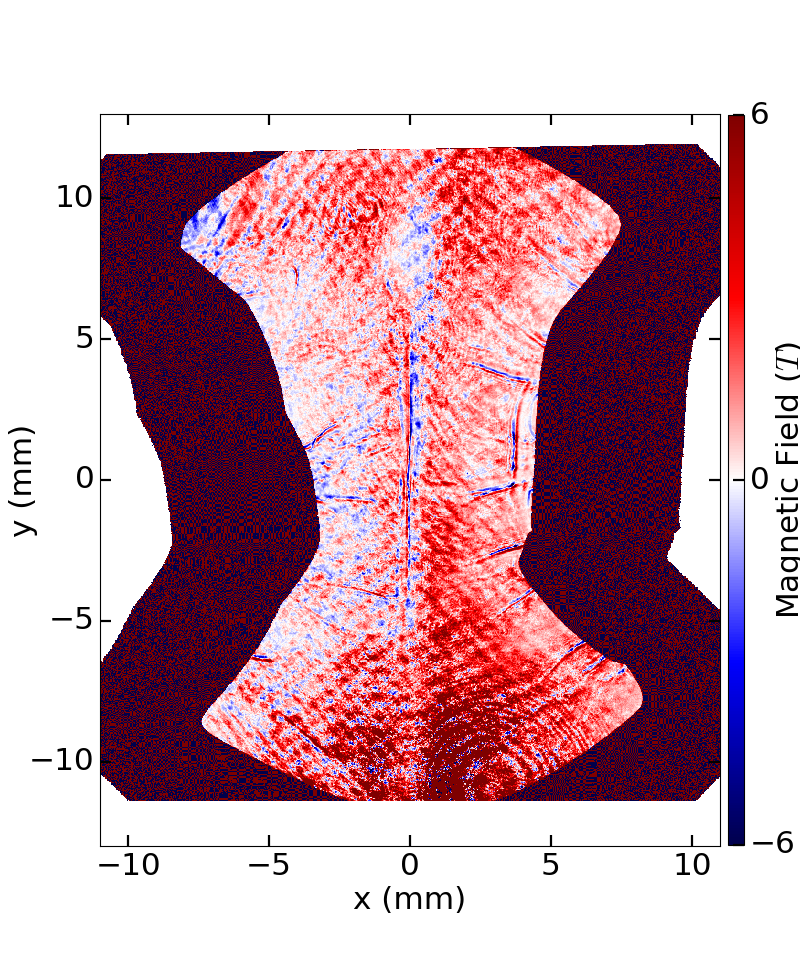

In [35]:
fig, ax=plt.subplots(figsize=(10,12))
far=b.plot_data_mm(ax=ax, clim=[-6,6])
ax.set_xlabel('x (mm)',fontsize=28)
ax.set_ylabel('y (mm)',fontsize=28)

ax.set_xticks([-10,-5,0,5,10])
ax.set_yticks([-10,-5,0,5,10])

ax.tick_params(labelsize=28, pad=5, length=10, width=2)
ax.get_yaxis().set_label_coords(-0.1,0.5)

cbar_ax = fig.add_axes([0.91, 0.12, 0.02, 0.76])#left,bottom,width,height
cbar_ax.tick_params(labelsize=28, pad=5, length=10, width=2)
fig.colorbar(far, cax=cbar_ax, ticks=[-6,0,6])
cbar_ax.set_ylabel(r'Magnetic Field ($T$)',fontsize=28)

cbar_ax.get_yaxis().set_label_coords(2.9,0.5)


<IPython.core.display.Javascript object>


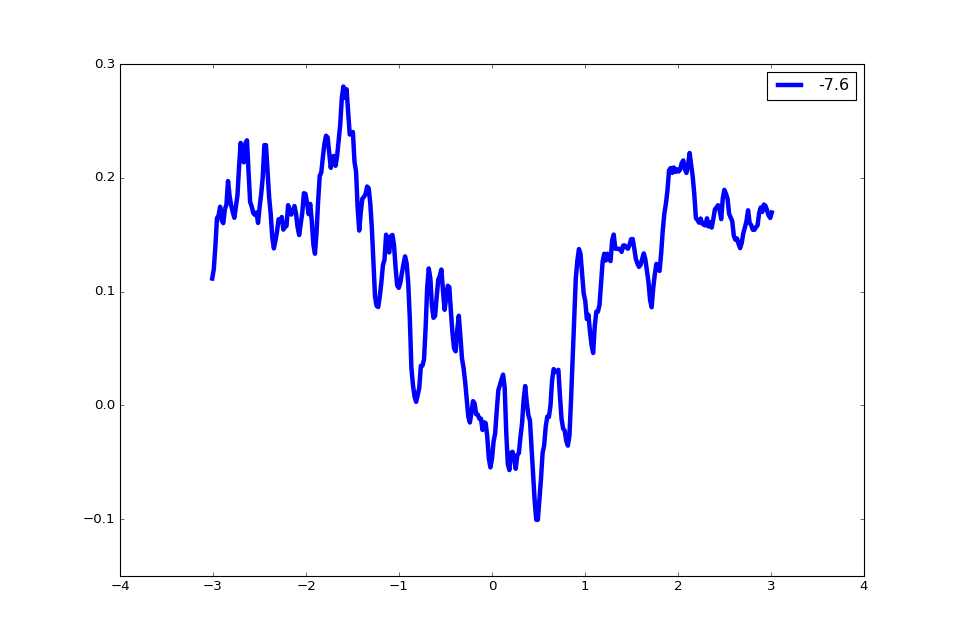

(318, 472) (318, 826)


In [131]:
fig, ax=plt.subplots(figsize=(12,8))

yy=-7.6
s.create_lineout(start=(yy,-3), end=(yy,3), lineout_width=2*s.scale)
s.plot_lineout(ax=ax, label=str(yy))
ax.legend()

## Bring in corrections to alpha

In [51]:
origin=b.origin
scale=b.scale
extent=b.extent[2:4]+b.extent[0:2]

ymin=origin[0]-extent[1]*scale
ymax=origin[0]-extent[0]*scale
xmin=origin[1]+extent[2]*scale
xmax=origin[1]+extent[3]*scale
n_e_cropped=b.IT[ymin:ymax, xmin:xmax] 

C:\Users\jdavies\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: RuntimeWarning: divide by zero encountered in true_divide
  if __name__ == '__main__':
C:\Users\jdavies\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: RuntimeWarning: overflow encountered in true_divide
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


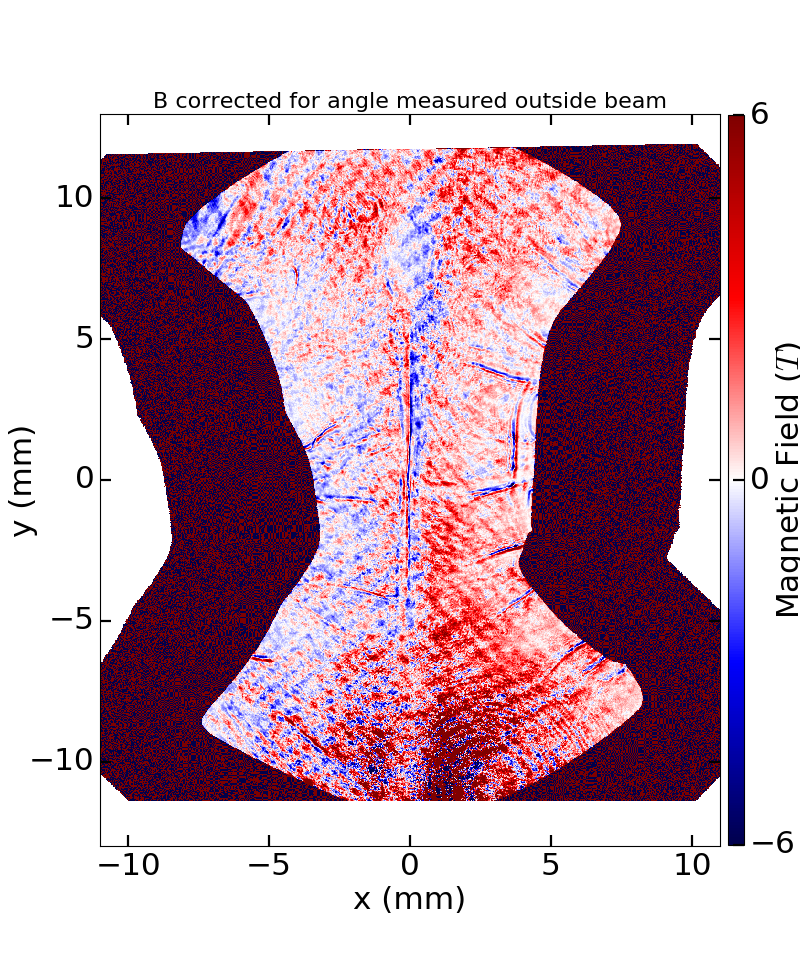

In [66]:
B_metal=5.99e18*alpha_metal/n_e_cropped

fig, ax=plt.subplots(figsize=(10,12))
far=ax.imshow(B_metal, cmap=b.cmap, interpolation='none', clim=[-6,6], extent=b.extent, aspect=1)
ax.set_xlabel('x (mm)',fontsize=28)
ax.set_ylabel('y (mm)',fontsize=28)

ax.set_xticks([-10,-5,0,5,10])
ax.set_yticks([-10,-5,0,5,10])

ax.tick_params(labelsize=28, pad=5, length=10, width=2)
ax.get_yaxis().set_label_coords(-0.1,0.5)

ax.set_title('B corrected for angle measured outside beam', fontsize=20)

cbar_ax = fig.add_axes([0.91, 0.12, 0.02, 0.76])#left,bottom,width,height
cbar_ax.tick_params(labelsize=28, pad=5, length=10, width=2)
fig.colorbar(far, cax=cbar_ax, ticks=[-6,0,6])
cbar_ax.set_ylabel(r'Magnetic Field ($T$)',fontsize=28)

cbar_ax.get_yaxis().set_label_coords(2.9,0.5)

In [67]:
fig.savefig('s0701_16 B corrected for angle outside laser beam.png', dpi=600, bbox_inches='tight')

C:\Users\jdavies\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: RuntimeWarning: divide by zero encountered in true_divide
  if __name__ == '__main__':
C:\Users\jdavies\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: RuntimeWarning: overflow encountered in true_divide
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


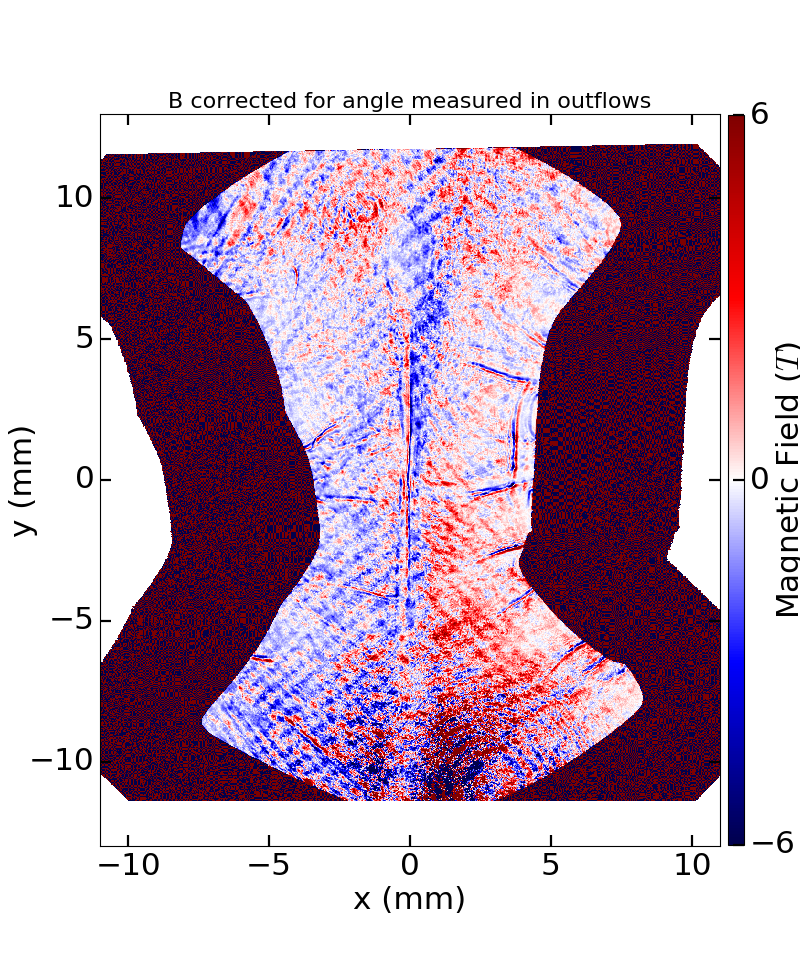

In [68]:
B_outflow=5.99e18*alpha_outflows/n_e_cropped

fig, ax=plt.subplots(figsize=(10,12))
far=ax.imshow(B_outflow, cmap=b.cmap, interpolation='none', clim=[-6,6], extent=b.extent, aspect=1)
ax.set_xlabel('x (mm)',fontsize=28)
ax.set_ylabel('y (mm)',fontsize=28)

ax.set_xticks([-10,-5,0,5,10])
ax.set_yticks([-10,-5,0,5,10])

ax.tick_params(labelsize=28, pad=5, length=10, width=2)
ax.get_yaxis().set_label_coords(-0.1,0.5)

ax.set_title('B corrected for angle measured in outflows', fontsize=20)

cbar_ax = fig.add_axes([0.91, 0.12, 0.02, 0.76])#left,bottom,width,height
cbar_ax.tick_params(labelsize=28, pad=5, length=10, width=2)
fig.colorbar(far, cax=cbar_ax, ticks=[-6,0,6])
cbar_ax.set_ylabel(r'Magnetic Field ($T$)',fontsize=28)

cbar_ax.get_yaxis().set_label_coords(2.9,0.5)

In [69]:
fig.savefig('s0701_16 B corrected for angle in outflows.png', dpi=600, bbox_inches='tight')

C:\Users\jdavies\Anaconda3\lib\site-packages\matplotlib\colors.py:576: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


# Just Interferometry

In [132]:
s0701_16_endon=NeLMap2('s0701_16 IR neL.txt', scale=102, multiply_by=1/1.6, rot_angle=-90)
i=s0701_16_endon

<IPython.core.display.Javascript object>


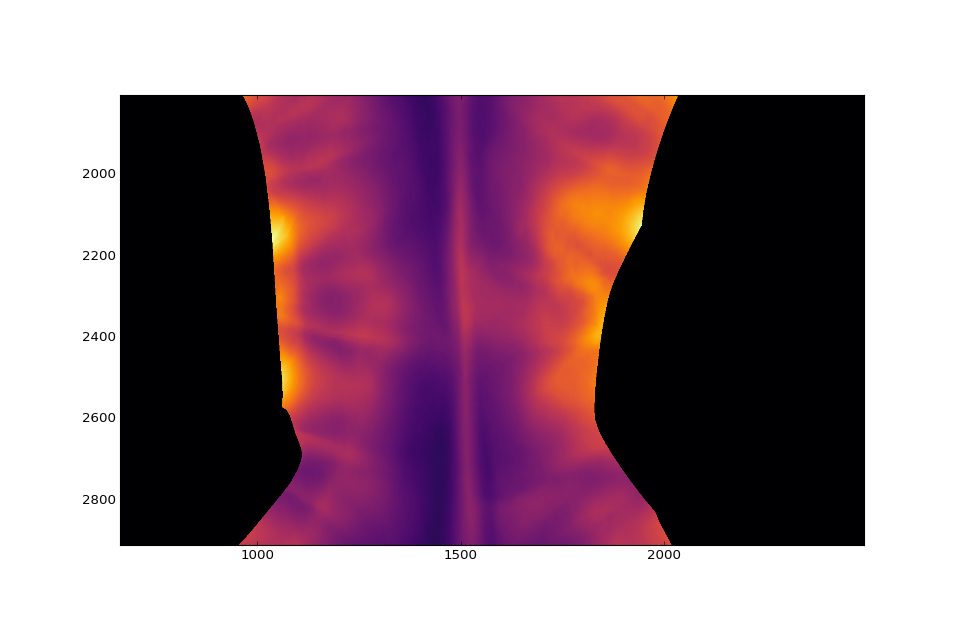

In [133]:
i.plot_data_px()

<IPython.core.display.Javascript object>


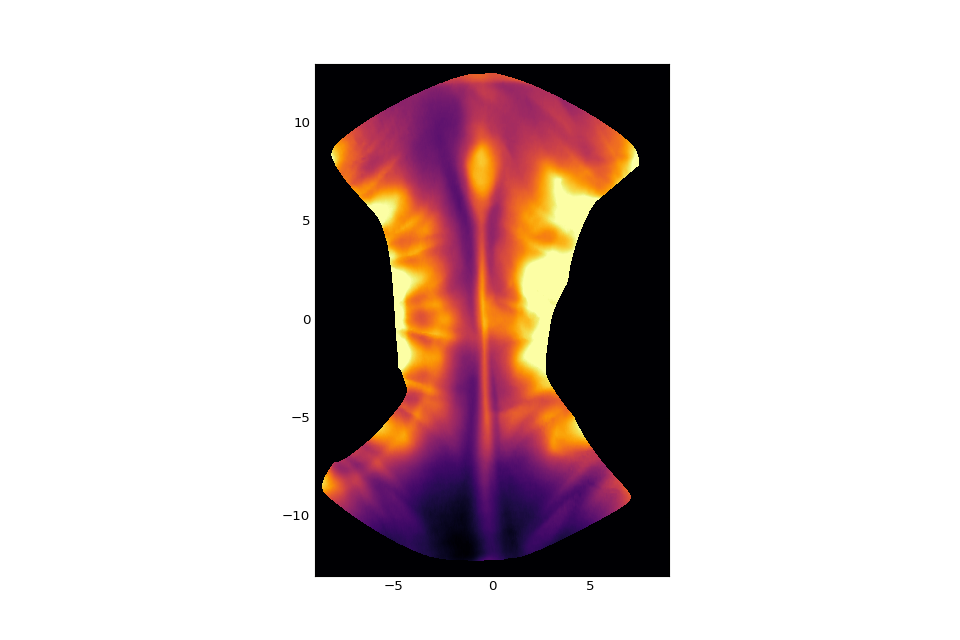

In [138]:
i.set_origin(origin=(2326,1550), extent=[-13,13,-9,9])
i.plot_data_mm(multiply_by=1e-18, clim=[0,1])

<IPython.core.display.Javascript object>


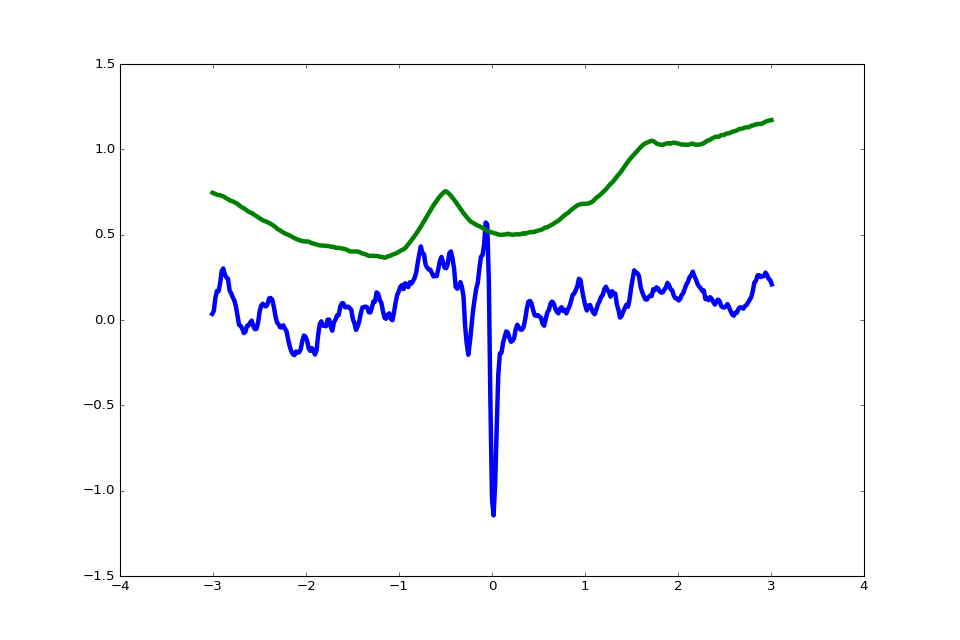

(666, 472) (666, 826)
(1152, 612) (1152, 1224)


C:\Users\jdavies\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:519: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


In [141]:
fig, ax=plt.subplots(figsize=(12,8))

yy=-1.7
w=0.2
s.create_lineout(start=(yy,-3), end=(yy,3), lineout_width=w*s.scale)
s.plot_lineout(ax=ax)
i.create_lineout(start=(yy,-3), end=(yy,3), lineout_width=w*s.scale)
i.plot_lineout(ax=ax, multiply_by=1e-18)
ax.legend()

# Old Code